# Import Library

## 
Files required 
1) gamma code = gamma(folder)
2) policy model = policy_model_discreteshift_final_3L_512H_s1_c3.pth
3) reference data = data(folder)
4) moving_average.py
5) GAMMA_obj_temp_depth.py

In [23]:
import numpy as np
import pandas as pd
from typing import Optional, Tuple
import sys
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from pickle import dump
from sklearn.preprocessing import MinMaxScaler
import time
from tqdm import tqdm
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import os

# Resolve the primary compute device once and reuse it throughout the notebook.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

from moving_average import moving_average_1d
import copy

from GAMMA_obj_temp_depth import GAMMA_obj


Using device: cuda:0


# Import Policy Model

In [24]:
from policy import PolicyNN
import torch

# confirm which devices are available
print(torch.cuda.device_count())  # should be ≥1 to use CUDA

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
# or force CPU: device = torch.device('cpu')

model = PolicyNN(
    past_input_dim=6,
    future_input_dim=6,
    output_dim=1,
    p=50,
    window=50,
    hidden_dim=512,
    n_layers=3,
    dropout_p=0.1
).to(device)

state = torch.load(
    "/home/ftk3187/github/DPC_research/02_DED/4_policy_0725/trainresults/policy_model_discreteshift_final_3L_512H_s1_c3.pth",
    map_location=device,
)
model.load_state_dict(state)
model.eval()

1


PolicyNN(
  (input_layer): Linear(in_features=600, out_features=512, bias=True)
  (input_ln): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (hidden_layers): ModuleList(
    (0): Linear(in_features=512, out_features=512, bias=True)
  )
  (norm_layers): ModuleList(
    (0): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
  (output_layer): Linear(in_features=512, out_features=50, bias=True)
)

In [25]:
import math

class KFACLaplaceOnline:
    """Kronecker-factored Laplace approximation that updates online for PolicyNN."""

    def __init__(self, model: PolicyNN, prior_precision: float = 1.0, likelihood_std: float = 0.05, damping: float = 1e-3):
        self.model = model
        self.model.eval()
        self.prior_precision = prior_precision
        self.likelihood_std = likelihood_std
        self.damping = damping

        self.layers = [module for module in self.model.modules() if isinstance(module, nn.Linear)]
        if not self.layers:
            raise ValueError('PolicyNN must contain linear layers for KFAC Laplace.')

        self.activations = {layer: None for layer in self.layers}
        self.backprops = {layer: None for layer in self.layers}
        self.layer_stats = {
            layer: {
                'A': torch.zeros((layer.in_features, layer.in_features), dtype=torch.float64, device=layer.weight.device),
                'G': torch.zeros((layer.out_features, layer.out_features), dtype=torch.float64, device=layer.weight.device),
            }
            for layer in self.layers
        }
        self.layer_covariances = {}
        self.sample_count = 0
        self.output_count = 0

        self._register_hooks()

    def _register_hooks(self):
        def make_forward_hook(layer):
            def _hook(module, inputs, output):
                self.activations[layer] = inputs[0].detach()
            return _hook

        def make_backward_hook(layer):
            def _hook(module, grad_input, grad_output):
                self.backprops[layer] = grad_output[0].detach()
            return _hook

        for layer in self.layers:
            layer.register_forward_hook(make_forward_hook(layer))
            layer.register_full_backward_hook(make_backward_hook(layer))

    def _clear_backprops(self):
        for layer in self.layers:
            self.backprops[layer] = None

    def _update_covariances(self):
        if self.sample_count == 0 or self.output_count == 0:
            return
        for layer in self.layers:
            A_mean = self.layer_stats[layer]['A'] / self.sample_count
            G_mean = self.layer_stats[layer]['G'] / self.output_count

            in_dim = layer.in_features
            out_dim = layer.out_features

            eye_in = torch.eye(in_dim, dtype=torch.float64, device=A_mean.device)
            eye_out = torch.eye(out_dim, dtype=torch.float64, device=G_mean.device)

            A_damped = A_mean + (self.prior_precision + self.damping) * eye_in
            G_damped = G_mean + (self.prior_precision + self.damping) * eye_out

            self.layer_covariances[layer] = {
                'A': torch.linalg.inv(A_damped),
                'G': torch.linalg.inv(G_damped)
            }

    def evaluate(self, policy_past: torch.Tensor, policy_future: torch.Tensor, update_stats: bool = True):
        """Return mean control trajectory plus epistemic/total variance estimates."""
        self._clear_backprops()
        self.model.zero_grad(set_to_none=True)

        outputs = self.model((policy_past, policy_future))
        out_flat = outputs.view(outputs.shape[0], -1)
        batch_size, num_outputs = out_flat.shape

        mean = outputs.detach()
        epistemic_var = None
        total_var = None

        if self.layer_covariances:
            var_accum = torch.zeros(batch_size, num_outputs, dtype=torch.float64, device=outputs.device)
            for out_idx in range(num_outputs):
                grad_outputs = torch.zeros_like(out_flat)
                grad_outputs[:, out_idx] = 1.0
                self._clear_backprops()
                self.model.zero_grad(set_to_none=True)
                out_flat.backward(grad_outputs, retain_graph=True)

                for layer in self.layers:
                    a = self.activations[layer].to(torch.float64)
                    delta = self.backprops[layer].to(torch.float64)
                    A_cov = self.layer_covariances[layer]['A']
                    G_cov = self.layer_covariances[layer]['G']
                    delta_term = torch.einsum('bi,ij,bj->b', delta, G_cov, delta)
                    a_term = torch.einsum('bi,ij,bj->b', a, A_cov, a)
                    var_accum[:, out_idx] += delta_term * a_term

            epistemic_var = torch.clamp(var_accum.view_as(outputs).to(outputs.dtype), min=1e-12)
            total_var = epistemic_var + (self.likelihood_std ** 2)

        if update_stats:
            scale = 1.0 / (self.likelihood_std ** 2)
            scale_sqrt = math.sqrt(scale)

            with torch.no_grad():
                for layer in self.layers:
                    a = self.activations[layer].to(torch.float64)
                    self.layer_stats[layer]['A'] += a.transpose(0, 1) @ a

            for out_idx in range(num_outputs):
                grad_outputs = torch.zeros_like(out_flat)
                grad_outputs[:, out_idx] = scale_sqrt
                self._clear_backprops()
                self.model.zero_grad(set_to_none=True)
                retain = out_idx < (num_outputs - 1)
                out_flat.backward(grad_outputs, retain_graph=retain)

                for layer in self.layers:
                    delta = self.backprops[layer].to(torch.float64)
                    self.layer_stats[layer]['G'] += delta.transpose(0, 1) @ delta

            self.sample_count += batch_size
            self.output_count += batch_size * num_outputs
            self._update_covariances()

        self.model.zero_grad(set_to_none=True)
        self._clear_backprops()
        return mean, epistemic_var, total_var



In [26]:
kfac_laplace = KFACLaplaceOnline(model, prior_precision=1.0, likelihood_std=0.05, damping=1e-3)

uncertainty_log = {
    'mean_control': [],
    'epistemic_var_scaled': [],
    'epistemic_var_original': [],
    'total_var_scaled': [],
    'total_var_original': []
}


# Import Reference Data

In [27]:
import cupy as cp

device_count = cp.cuda.runtime.getDeviceCount()
if device_count == 0:
    raise RuntimeError('No CUDA devices detected for GAMMA simulation.')

cp.cuda.Device(0).use()


<CUDA Device 0>

In [28]:
import cupy as cp
device_id = min(0, cp.cuda.runtime.getDeviceCount() - 1)  # pick GPU 0 by default
cp.cuda.Device(device_id).use()

INPUT_DATA_DIR = "data"
SIM_DIR_NAME = "single_track_square"
BASE_LASER_FILE_DIR = "laser_power_profiles/csv"
CLOUD_TARGET_BASE_PATH = "result"
solidus_temp = 1600
window = 50
sim_interval = 5
init_runs = 50 #50 

GAMMA_class = GAMMA_obj(INPUT_DATA_DIR, SIM_DIR_NAME, BASE_LASER_FILE_DIR, CLOUD_TARGET_BASE_PATH, solidus_temp, window, init_runs, sim_interval, laser_power_number=1)
init_avg = GAMMA_class.run_initial_steps()
init_avg = torch.tensor(init_avg,dtype=torch.float32)[:,-window:] # shape = [2,50]

100%|██████████| 250/250 [00:05<00:00, 42.11it/s]


In [29]:
df_one_print = pd.read_csv('single_track_ref.csv')

loc_X_list = df_one_print["X"].to_numpy().reshape(-1,1)
loc_Y_list = df_one_print["Y"].to_numpy().reshape(-1,1)
loc_Z_list = df_one_print["Z"].to_numpy().reshape(-1,1)
dist_X_list = df_one_print["Dist_to_nearest_X"].to_numpy().reshape(-1,1)
dist_Y_list = df_one_print["Dist_to_nearest_Y"].to_numpy().reshape(-1,1)
scan_spd_list = df_one_print["scanning_speed"].to_numpy().reshape(-1,1)

# laser power
laser_power_ref = torch.tensor(df_one_print["Laser_power"].to_numpy().reshape(-1,1),dtype=torch.float32)
laser_power_past = laser_power_ref[:window]
fix_covariates = torch.tensor(np.concatenate((loc_Z_list,dist_X_list,dist_Y_list),axis=1),dtype=torch.float32)

# apply moving average for mp temp
mp_temp_raw = df_one_print["melt_pool_temperature"].to_numpy()
mp_temp_mv = moving_average_1d(mp_temp_raw,4)
mp_temp = copy.deepcopy(mp_temp_raw)
mp_temp[1:-2] = mp_temp_mv
mp_temp = mp_temp

mp_temp_ref = torch.tensor(mp_temp,dtype=torch.float32)

x_min = torch.tensor([[0.0, 0.75, 0.75, 504.26]], dtype=torch.float32).to(device)
x_max = torch.tensor([[7.5, 20.0, 20.0, 732.298]], dtype=torch.float32).to(device)

y_min = torch.tensor([[436.608, -0.559]], dtype=torch.float32).to(device)
y_max = torch.tensor([[4509.855, 0.551]], dtype=torch.float32).to(device)

# Precompute constants that map control values between scaled and original units.
LASER_SCALE = float(0.5 * (x_max[0, 3].item() - x_min[0, 3].item()))
LASER_OFFSET = float(x_min[0, 3].item())


In [30]:
x_min = torch.tensor([[0.0, 0.75, 0.75, 504.26]], dtype=torch.float32).to(device)
x_max = torch.tensor([[7.5, 20.0, 20.0, 732.298]], dtype=torch.float32).to(device)

y_min = torch.tensor([[436.608, -0.559]], dtype=torch.float32).to(device)
y_max = torch.tensor([[4509.855, 0.551]], dtype=torch.float32).to(device)


In [31]:
def normalize_x(x, dim_id):
    x_min_selected = x_min[0, dim_id]
    x_max_selected = x_max[0, dim_id]
    return 2 * (x - x_min_selected) / (x_max_selected - x_min_selected) - 1

def inverse_normalize_x(x_norm, dim_id):
    x_min_selected = x_min[0, dim_id]
    x_max_selected = x_max[0, dim_id]
    return 0.5 * (x_norm + 1) * (x_max_selected - x_min_selected) + x_min_selected

def normalize_y(y, dim_id):
    y_min_selected = y_min[0, dim_id]
    y_max_selected = y_max[0, dim_id]
    return 2 * (y - y_min_selected) / (y_max_selected - y_min_selected) - 1

def inverse_normalize_y(y_norm, dim_id):
    y_min_selected = y_min[0, dim_id]
    y_max_selected = y_max[0, dim_id]
    return 0.5 * (y_norm + 1) * (y_max_selected - y_min_selected) + y_min_selected


# Sub-Function ; Run Policy

In [32]:
import os
import copy
from pathlib import Path

def clone_gamma(G):
    return copy.deepcopy(G)

def rollout_future(G_clone, control_seq):
    temps, depths = [], []
    for u in control_seq:
        x, d = G_clone.run_sim_interval(float(u))
        temps.append(x)
        depths.append(d)
    return temps, depths


def run_one_step_policy(GAMMA_obj, policy_model, P, window, laplace=None, uncertainty_log=None):

    # ===== 기존 policy 코드 =====
    mp_temp_ref = GAMMA_obj.ref[GAMMA_obj.MPC_counter:GAMMA_obj.MPC_counter + P]
    mp_temp_ref_t = torch.as_tensor(mp_temp_ref, dtype=torch.float32, device=device).reshape(1, P, 1)

    mp_temp_past_t = GAMMA_obj.x_past.T.unsqueeze(0).to(device) 
    laser_past_t = GAMMA_obj.u_past.view(1, -1, 1).to(device)
    fix_cov_past = GAMMA_obj.fix_cov_all[GAMMA_obj.MPC_counter - window:GAMMA_obj.MPC_counter, :]
    fix_cov_past_t = torch.as_tensor(fix_cov_past, dtype=torch.float32, device=device).unsqueeze(0)

    fix_cov_past_s = normalize_x(fix_cov_past_t, dim_id=[0, 1, 2])
    laser_past_s = normalize_x(laser_past_t, dim_id=[3])
    mp_temp_past_s = normalize_y(mp_temp_past_t, dim_id=[0, 1])
    policy_in_past = torch.cat((fix_cov_past_s, laser_past_s, mp_temp_past_s), dim=2)

    fix_cov_future = GAMMA_obj.fix_cov_all[GAMMA_obj.MPC_counter:GAMMA_obj.MPC_counter + P, :]
    fix_cov_future_t = torch.as_tensor(fix_cov_future, dtype=torch.float32, device=device).unsqueeze(0)
    fix_cov_future_s = normalize_x(fix_cov_future_t, dim_id=[0, 1, 2])
    mp_temp_ref_s = normalize_y(mp_temp_ref_t, dim_id=[0])[:, :, 0].unsqueeze(-1)

    depth_lower_const = 0.1423
    depth_upper_const = 0.4126
    y_const_s = torch.tensor([[depth_lower_const, depth_upper_const]] * P, dtype=torch.float32, device=device).reshape(1, P, 2)
    policy_in_future = torch.cat((fix_cov_future_s, mp_temp_ref_s, y_const_s), dim=2)

    if laplace is not None:
        u_pred, epistemic_var, total_var = laplace.evaluate(policy_in_past, policy_in_future, update_stats=True)
    else:
        u_pred = policy_model((policy_in_past, policy_in_future))
        epistemic_var = None
        total_var = None


    # ===== Uncertainty logging =====
    if uncertainty_log is not None:
        laser_span = (x_max[0, 3] - x_min[0, 3]).item()
        laser_scale = 0.5 * laser_span
        laser_offset = x_min[0, 3].item()

        control_scaled = u_pred[0, 0, 0].detach().cpu()
        control_original = float((control_scaled + 1.0) * laser_scale + laser_offset)
        uncertainty_log['mean_control'].append(control_original)

        if epistemic_var is not None and total_var is not None:
            var_scaled = epistemic_var[0, 0, 0].detach().cpu()
            tot_scaled = total_var[0, 0, 0].detach().cpu()
            uncertainty_log['epistemic_var_scaled'].append(float(var_scaled))
            uncertainty_log['total_var_scaled'].append(float(tot_scaled))
            uncertainty_log['epistemic_var_original'].append(float((laser_scale ** 2) * var_scaled))
            uncertainty_log['total_var_original'].append(float((laser_scale ** 2) * tot_scaled))
        else:
            uncertainty_log['epistemic_var_scaled'].append(None)
            uncertainty_log['total_var_scaled'].append(None)
            uncertainty_log['epistemic_var_original'].append(None)
            uncertainty_log['total_var_original'].append(None)


    # ===== Apply nominal control =====
    u_first = u_pred[0, 0]
    u_applied = float(inverse_normalize_x(u_first, dim_id=[3]))
    x_current, depth_current = GAMMA_obj.run_sim_interval(u_applied)

    GAMMA_obj.x_past[:, :-1] = GAMMA_obj.x_past[:, 1:]
    GAMMA_obj.x_past[0, -1] = x_current
    GAMMA_obj.x_past[1, -1] = depth_current
    GAMMA_obj.u_past[:-1] = GAMMA_obj.u_past[1:].clone()
    GAMMA_obj.u_past[-1] = u_applied

    GAMMA_obj.x_hat_current = torch.tensor([x_current, depth_current], device=device)
    GAMMA_obj.x_sys_current = torch.tensor([[x_current], [depth_current]], device=device)

    GAMMA_obj.MPC_counter += 1

    new_state = torch.tensor([[x_current, depth_current]], device=GAMMA_obj.x_past_save.device)
    GAMMA_obj.x_past_save = torch.cat((GAMMA_obj.x_past_save, new_state), dim=0)
    new_u = torch.tensor([[u_applied]], device=GAMMA_obj.u_past_save.device)
    GAMMA_obj.u_past_save = torch.cat((GAMMA_obj.u_past_save, new_u), dim=0)


    # ============================================================
    # ✅ FUTURE UPPER / LOWER ROLLOUT SIMULATION (every 50 steps)
    # ============================================================
    k = GAMMA_obj.MPC_counter

    if k % 50 == 0:

        # -------- Future control mean (always compute) --------
        mean_scaled = u_pred[0, :, 0].detach().cpu().numpy()
        mean = (mean_scaled + 1.0) * laser_scale + laser_offset  # real scale [W]

        # Initialize upper/lower as mean by default (fallback)
        upper = mean.copy()
        lower = mean.copy()

        # -------- If variance available, compute uncertainty band --------
        if (total_var is not None) and (len(uncertainty_log['total_var_original']) >= P):

            var_list = uncertainty_log['total_var_original'][-P:]

            # if any None → skip uncertainty band (remain mean only)
            if not any(v is None for v in var_list):
                var = np.array(var_list)
                std = np.sqrt(var)
                upper = mean + 1.28 * std
                lower = mean - 1.28 * std

        # -------- Virtual rollouts (does not affect real sim) --------
        G_up = clone_gamma(GAMMA_obj)
        G_low = clone_gamma(GAMMA_obj)

        fut_temp_up, fut_depth_up = rollout_future(G_up, upper)
        fut_temp_low, fut_depth_low = rollout_future(G_low, lower)

        GAMMA_obj.future_temp_upper = fut_temp_up
        GAMMA_obj.future_temp_lower = fut_temp_low
        GAMMA_obj.future_depth_upper = fut_depth_up
        GAMMA_obj.future_depth_lower = fut_depth_low

        # -------- Save plot to disk --------
        save_dir = Path("plots")
        save_dir.mkdir(parents=True, exist_ok=True)
        fig_path = save_dir / f"mpc_step_{k:04d}.png"

        plot_fig(MPC_GAMMA=GAMMA_obj, N_step=k, i=k, uncertainty_log=uncertainty_log)
        plt.savefig(fig_path, dpi=200)
        plt.close()

        print(f"[INFO] Saved rollout plot at k={k}: {fig_path.resolve()}")


# Sub-Function ; Plot Rollout

In [33]:
def plot_fig(MPC_GAMMA, N_step, i, uncertainty_log=None):
    plt.figure(figsize=[12,10])

    # ----- Temperature -----
    plt.subplot(3,1,1)
    plt.plot(MPC_GAMMA.x_past_save[:N_step,0], label="GAMMA simulation")
    plt.plot(MPC_GAMMA.ref[:N_step], label="Reference")
    
    # future predicted band
    if hasattr(MPC_GAMMA, "future_temp_upper"):
        k = i
        t_future = np.arange(k, k + len(MPC_GAMMA.future_temp_upper))
        plt.plot(t_future, MPC_GAMMA.future_temp_upper, 'r--', label="Future upper")
        plt.plot(t_future, MPC_GAMMA.future_temp_lower, 'g--', label="Future lower")

    plt.legend()
    plt.xlim(0, i+50)
    plt.ylabel("MP Temp (K)")

    # ----- Depth -----
    plt.subplot(3,1,2)
    plt.plot(MPC_GAMMA.x_past_save[:N_step,1], label="GAMMA simulation")
    plt.plot(np.arange(N_step),0.225*np.ones(N_step), label="UB")
    plt.plot(np.arange(N_step),0.075*np.ones(N_step), label="LB")

    if hasattr(MPC_GAMMA, "future_depth_upper"):
        k = i
        t_future = np.arange(k, k + len(MPC_GAMMA.future_depth_upper))
        plt.plot(t_future, MPC_GAMMA.future_depth_upper, 'r--', label="Future upper")
        plt.plot(t_future, MPC_GAMMA.future_depth_lower, 'g--', label="Future lower")

    plt.legend()
    plt.xlim(0, i+50)
    plt.ylabel("MP Depth (mm)")

    # ----- Laser -----
    plt.subplot(3,1,3)
    plt.plot(MPC_GAMMA.u_past_save[:N_step], label="Laser power (applied)")
    
    if uncertainty_log is not None and len(uncertainty_log["mean_control"]) > 0:
        mean = np.array(uncertainty_log['mean_control'])
        var = np.array(uncertainty_log['total_var_original'], dtype=float)

        # remove None / nan values
        valid = ~np.isnan(var)
        mean = mean[valid]
        var = var[valid]

        t = np.arange(len(mean))
        std = np.sqrt(var)
        upper = mean + 1.28 * std
        lower = mean - 1.28 * std

        # shading band
        # plt.plot(t, mean, color='orange', label="Policy mean")
        plt.fill_between(t+50, lower, upper, alpha=0.3, color='orange', label="90% CI")
        
    plt.ylabel("Laser power (W)")
    plt.xlabel("MPC time step (0.0355 sec/iteration)")
    plt.xlim(0, i+50)
    plt.legend()


    plt.tight_layout()
    return plt


# Execution

  1%|          | 50/6295 [00:26<7:06:22,  4.10s/it]

[INFO] Saved rollout plot at k=100: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0100.png


  2%|▏         | 100/6295 [00:53<6:54:38,  4.02s/it]

[INFO] Saved rollout plot at k=150: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0150.png


  2%|▏         | 150/6295 [01:20<6:54:11,  4.04s/it]

[INFO] Saved rollout plot at k=200: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0200.png


  3%|▎         | 200/6295 [01:47<6:52:32,  4.06s/it]

[INFO] Saved rollout plot at k=250: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0250.png


  4%|▍         | 250/6295 [02:15<6:49:58,  4.07s/it]

[INFO] Saved rollout plot at k=300: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0300.png


  5%|▍         | 300/6295 [02:42<6:47:27,  4.08s/it]

[INFO] Saved rollout plot at k=350: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0350.png


  6%|▌         | 350/6295 [03:09<6:44:43,  4.08s/it]

[INFO] Saved rollout plot at k=400: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0400.png


  6%|▋         | 400/6295 [03:36<6:42:58,  4.10s/it]

[INFO] Saved rollout plot at k=450: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0450.png


  7%|▋         | 450/6295 [04:04<6:40:35,  4.11s/it]

[INFO] Saved rollout plot at k=500: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0500.png


  8%|▊         | 500/6295 [04:31<6:44:43,  4.19s/it]

[INFO] Saved rollout plot at k=550: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0550.png


  9%|▊         | 550/6295 [04:59<6:34:36,  4.12s/it]

[INFO] Saved rollout plot at k=600: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0600.png


 10%|▉         | 600/6295 [05:27<6:38:32,  4.20s/it]

[INFO] Saved rollout plot at k=650: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0650.png


 10%|█         | 650/6295 [05:55<6:35:16,  4.20s/it]

[INFO] Saved rollout plot at k=700: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0700.png


 11%|█         | 700/6295 [06:22<6:33:16,  4.22s/it]

[INFO] Saved rollout plot at k=750: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0750.png


 12%|█▏        | 750/6295 [06:50<6:29:31,  4.21s/it]

[INFO] Saved rollout plot at k=800: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0800.png


 13%|█▎        | 800/6295 [07:18<6:29:03,  4.25s/it]

[INFO] Saved rollout plot at k=850: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0850.png


 14%|█▎        | 850/6295 [07:46<6:21:55,  4.21s/it]

[INFO] Saved rollout plot at k=900: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0900.png


 14%|█▍        | 900/6295 [08:14<6:20:46,  4.23s/it]

[INFO] Saved rollout plot at k=950: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_0950.png


 15%|█▌        | 950/6295 [08:42<6:17:06,  4.23s/it]

[INFO] Saved rollout plot at k=1000: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1000.png


 16%|█▌        | 1000/6295 [09:10<6:23:29,  4.35s/it]

[INFO] Saved rollout plot at k=1050: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1050.png


 17%|█▋        | 1050/6295 [09:38<6:11:55,  4.25s/it]

[INFO] Saved rollout plot at k=1100: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1100.png


 17%|█▋        | 1100/6295 [10:07<6:11:33,  4.29s/it]

[INFO] Saved rollout plot at k=1150: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1150.png


 18%|█▊        | 1150/6295 [10:35<6:07:50,  4.29s/it]

[INFO] Saved rollout plot at k=1200: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1200.png


 19%|█▉        | 1200/6295 [11:04<6:09:52,  4.36s/it]

[INFO] Saved rollout plot at k=1250: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1250.png


 20%|█▉        | 1250/6295 [11:33<6:06:54,  4.36s/it]

[INFO] Saved rollout plot at k=1300: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1300.png


 21%|██        | 1300/6295 [12:01<6:06:16,  4.40s/it]

[INFO] Saved rollout plot at k=1350: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1350.png


 21%|██▏       | 1350/6295 [12:30<6:01:39,  4.39s/it]

[INFO] Saved rollout plot at k=1400: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1400.png


 22%|██▏       | 1400/6295 [12:59<5:56:50,  4.37s/it]

[INFO] Saved rollout plot at k=1450: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1450.png


 23%|██▎       | 1450/6295 [13:28<5:55:15,  4.40s/it]

[INFO] Saved rollout plot at k=1500: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1500.png


 24%|██▍       | 1500/6295 [13:57<5:51:26,  4.40s/it]

[INFO] Saved rollout plot at k=1550: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1550.png


 25%|██▍       | 1550/6295 [14:26<5:46:19,  4.38s/it]

[INFO] Saved rollout plot at k=1600: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1600.png


 25%|██▌       | 1600/6295 [14:55<5:45:40,  4.42s/it]

[INFO] Saved rollout plot at k=1650: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1650.png


 26%|██▌       | 1650/6295 [15:25<5:43:49,  4.44s/it]

[INFO] Saved rollout plot at k=1700: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1700.png


 27%|██▋       | 1700/6295 [15:54<5:41:04,  4.45s/it]

[INFO] Saved rollout plot at k=1750: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1750.png


 28%|██▊       | 1750/6295 [16:23<5:35:14,  4.43s/it]

[INFO] Saved rollout plot at k=1800: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1800.png


 29%|██▊       | 1800/6295 [16:53<5:38:19,  4.52s/it]

[INFO] Saved rollout plot at k=1850: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1850.png


 29%|██▉       | 1850/6295 [17:22<5:33:32,  4.50s/it]

[INFO] Saved rollout plot at k=1900: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1900.png


 30%|███       | 1900/6295 [17:52<5:32:09,  4.53s/it]

[INFO] Saved rollout plot at k=1950: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_1950.png


 31%|███       | 1950/6295 [18:21<5:27:32,  4.52s/it]

[INFO] Saved rollout plot at k=2000: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2000.png


 32%|███▏      | 2000/6295 [18:51<5:24:49,  4.54s/it]

[INFO] Saved rollout plot at k=2050: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2050.png


 33%|███▎      | 2050/6295 [19:21<5:22:14,  4.55s/it]

[INFO] Saved rollout plot at k=2100: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2100.png


 33%|███▎      | 2100/6295 [19:51<5:19:02,  4.56s/it]

[INFO] Saved rollout plot at k=2150: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2150.png


 34%|███▍      | 2150/6295 [20:21<5:14:28,  4.55s/it]

[INFO] Saved rollout plot at k=2200: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2200.png


 35%|███▍      | 2200/6295 [20:51<5:11:17,  4.56s/it]

[INFO] Saved rollout plot at k=2250: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2250.png


 36%|███▌      | 2250/6295 [21:21<5:07:27,  4.56s/it]

[INFO] Saved rollout plot at k=2300: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2300.png


 37%|███▋      | 2300/6295 [21:51<5:05:02,  4.58s/it]

[INFO] Saved rollout plot at k=2350: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2350.png


 37%|███▋      | 2350/6295 [22:20<4:57:54,  4.53s/it]

[INFO] Saved rollout plot at k=2400: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2400.png


 38%|███▊      | 2400/6295 [22:51<5:08:56,  4.76s/it]

[INFO] Saved rollout plot at k=2450: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2450.png


 39%|███▉      | 2450/6295 [23:21<4:57:06,  4.64s/it]

[INFO] Saved rollout plot at k=2500: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2500.png


 40%|███▉      | 2500/6295 [23:51<4:56:24,  4.69s/it]

[INFO] Saved rollout plot at k=2550: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2550.png


 41%|████      | 2550/6295 [24:22<4:57:07,  4.76s/it]

[INFO] Saved rollout plot at k=2600: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2600.png


 41%|████▏     | 2600/6295 [24:53<4:50:07,  4.71s/it]

[INFO] Saved rollout plot at k=2650: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2650.png


 42%|████▏     | 2650/6295 [25:24<4:46:09,  4.71s/it]

[INFO] Saved rollout plot at k=2700: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2700.png


 43%|████▎     | 2700/6295 [25:55<4:44:20,  4.75s/it]

[INFO] Saved rollout plot at k=2750: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2750.png


 44%|████▎     | 2750/6295 [26:25<4:40:39,  4.75s/it]

[INFO] Saved rollout plot at k=2800: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2800.png


 44%|████▍     | 2800/6295 [26:56<4:32:50,  4.68s/it]

[INFO] Saved rollout plot at k=2850: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2850.png


 45%|████▌     | 2850/6295 [27:27<4:28:21,  4.67s/it]

[INFO] Saved rollout plot at k=2900: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2900.png


 46%|████▌     | 2900/6295 [27:57<4:23:13,  4.65s/it]

[INFO] Saved rollout plot at k=2950: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_2950.png


 47%|████▋     | 2950/6295 [28:27<4:20:22,  4.67s/it]

[INFO] Saved rollout plot at k=3000: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3000.png


 48%|████▊     | 3000/6295 [28:58<4:14:50,  4.64s/it]

[INFO] Saved rollout plot at k=3050: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3050.png


 48%|████▊     | 3050/6295 [29:28<4:13:19,  4.68s/it]

[INFO] Saved rollout plot at k=3100: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3100.png


 49%|████▉     | 3100/6295 [29:59<4:12:30,  4.74s/it]

[INFO] Saved rollout plot at k=3150: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3150.png


 50%|█████     | 3150/6295 [30:30<4:08:06,  4.73s/it]

[INFO] Saved rollout plot at k=3200: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3200.png


 51%|█████     | 3200/6295 [31:00<4:02:25,  4.70s/it]

[INFO] Saved rollout plot at k=3250: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3250.png


 52%|█████▏    | 3250/6295 [31:31<4:00:44,  4.74s/it]

[INFO] Saved rollout plot at k=3300: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3300.png


 52%|█████▏    | 3300/6295 [32:02<3:58:05,  4.77s/it]

[INFO] Saved rollout plot at k=3350: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3350.png


 53%|█████▎    | 3350/6295 [32:33<3:53:36,  4.76s/it]

[INFO] Saved rollout plot at k=3400: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3400.png


 54%|█████▍    | 3400/6295 [33:04<3:50:02,  4.77s/it]

[INFO] Saved rollout plot at k=3450: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3450.png


 55%|█████▍    | 3450/6295 [33:35<3:46:16,  4.77s/it]

[INFO] Saved rollout plot at k=3500: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3500.png


 56%|█████▌    | 3500/6295 [34:06<3:41:50,  4.76s/it]

[INFO] Saved rollout plot at k=3550: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3550.png


 56%|█████▋    | 3550/6295 [34:37<3:38:29,  4.78s/it]

[INFO] Saved rollout plot at k=3600: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3600.png


 57%|█████▋    | 3600/6295 [35:08<3:31:54,  4.72s/it]

[INFO] Saved rollout plot at k=3650: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3650.png


 58%|█████▊    | 3650/6295 [35:39<3:31:27,  4.80s/it]

[INFO] Saved rollout plot at k=3700: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3700.png


 59%|█████▉    | 3700/6295 [36:09<3:28:10,  4.81s/it]

[INFO] Saved rollout plot at k=3750: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3750.png


 60%|█████▉    | 3750/6295 [36:41<3:24:52,  4.83s/it]

[INFO] Saved rollout plot at k=3800: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3800.png


 60%|██████    | 3800/6295 [37:12<3:19:30,  4.80s/it]

[INFO] Saved rollout plot at k=3850: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3850.png


 61%|██████    | 3850/6295 [37:43<3:16:30,  4.82s/it]

[INFO] Saved rollout plot at k=3900: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3900.png


 62%|██████▏   | 3900/6295 [38:14<3:14:24,  4.87s/it]

[INFO] Saved rollout plot at k=3950: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_3950.png


 63%|██████▎   | 3950/6295 [38:45<3:09:35,  4.85s/it]

[INFO] Saved rollout plot at k=4000: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4000.png


 64%|██████▎   | 4000/6295 [39:16<3:05:42,  4.86s/it]

[INFO] Saved rollout plot at k=4050: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4050.png


 64%|██████▍   | 4050/6295 [39:48<3:01:57,  4.86s/it]

[INFO] Saved rollout plot at k=4100: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4100.png


 65%|██████▌   | 4100/6295 [40:19<2:58:01,  4.87s/it]

[INFO] Saved rollout plot at k=4150: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4150.png


 66%|██████▌   | 4150/6295 [40:51<2:54:18,  4.88s/it]

[INFO] Saved rollout plot at k=4200: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4200.png


 67%|██████▋   | 4200/6295 [41:22<2:48:12,  4.82s/it]

[INFO] Saved rollout plot at k=4250: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4250.png


 68%|██████▊   | 4250/6295 [41:53<2:46:30,  4.89s/it]

[INFO] Saved rollout plot at k=4300: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4300.png


 68%|██████▊   | 4300/6295 [42:25<2:40:05,  4.81s/it]

[INFO] Saved rollout plot at k=4350: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4350.png


 69%|██████▉   | 4350/6295 [42:56<2:38:49,  4.90s/it]

[INFO] Saved rollout plot at k=4400: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4400.png


 70%|██████▉   | 4400/6295 [43:28<2:40:06,  5.07s/it]

[INFO] Saved rollout plot at k=4450: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4450.png


 71%|███████   | 4450/6295 [44:00<2:39:23,  5.18s/it]

[INFO] Saved rollout plot at k=4500: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4500.png


 71%|███████▏  | 4500/6295 [44:32<2:28:26,  4.96s/it]

[INFO] Saved rollout plot at k=4550: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4550.png


 72%|███████▏  | 4550/6295 [45:04<2:24:12,  4.96s/it]

[INFO] Saved rollout plot at k=4600: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4600.png


 73%|███████▎  | 4600/6295 [45:36<2:19:37,  4.94s/it]

[INFO] Saved rollout plot at k=4650: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4650.png


 74%|███████▍  | 4650/6295 [46:08<2:19:24,  5.09s/it]

[INFO] Saved rollout plot at k=4700: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4700.png


 75%|███████▍  | 4700/6295 [46:40<2:11:42,  4.95s/it]

[INFO] Saved rollout plot at k=4750: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4750.png


 75%|███████▌  | 4750/6295 [47:13<2:07:27,  4.95s/it]

[INFO] Saved rollout plot at k=4800: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4800.png


 76%|███████▋  | 4800/6295 [47:45<2:02:03,  4.90s/it]

[INFO] Saved rollout plot at k=4850: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4850.png


 77%|███████▋  | 4850/6295 [48:17<1:58:43,  4.93s/it]

[INFO] Saved rollout plot at k=4900: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4900.png


 78%|███████▊  | 4900/6295 [48:50<1:55:17,  4.96s/it]

[INFO] Saved rollout plot at k=4950: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_4950.png


 79%|███████▊  | 4950/6295 [49:23<1:51:18,  4.97s/it]

[INFO] Saved rollout plot at k=5000: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5000.png


 79%|███████▉  | 5000/6295 [49:56<1:48:27,  5.02s/it]

[INFO] Saved rollout plot at k=5050: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5050.png


 80%|████████  | 5050/6295 [50:29<1:43:01,  4.97s/it]

[INFO] Saved rollout plot at k=5100: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5100.png


 81%|████████  | 5100/6295 [51:02<1:40:03,  5.02s/it]

[INFO] Saved rollout plot at k=5150: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5150.png


 82%|████████▏ | 5150/6295 [51:35<1:35:03,  4.98s/it]

[INFO] Saved rollout plot at k=5200: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5200.png


 83%|████████▎ | 5200/6295 [52:07<1:30:38,  4.97s/it]

[INFO] Saved rollout plot at k=5250: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5250.png


 83%|████████▎ | 5250/6295 [52:41<1:36:05,  5.52s/it]

[INFO] Saved rollout plot at k=5300: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5300.png


 84%|████████▍ | 5300/6295 [53:15<1:27:54,  5.30s/it]

[INFO] Saved rollout plot at k=5350: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5350.png


 85%|████████▍ | 5350/6295 [53:47<1:20:21,  5.10s/it]

[INFO] Saved rollout plot at k=5400: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5400.png


 86%|████████▌ | 5400/6295 [54:20<1:15:22,  5.05s/it]

[INFO] Saved rollout plot at k=5450: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5450.png


 87%|████████▋ | 5450/6295 [54:52<1:11:28,  5.08s/it]

[INFO] Saved rollout plot at k=5500: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5500.png


 87%|████████▋ | 5500/6295 [55:25<1:07:35,  5.10s/it]

[INFO] Saved rollout plot at k=5550: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5550.png


 88%|████████▊ | 5550/6295 [55:57<1:03:02,  5.08s/it]

[INFO] Saved rollout plot at k=5600: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5600.png


 89%|████████▉ | 5600/6295 [56:30<59:11,  5.11s/it]  

[INFO] Saved rollout plot at k=5650: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5650.png


 90%|████████▉ | 5650/6295 [57:03<56:11,  5.23s/it]

[INFO] Saved rollout plot at k=5700: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5700.png


 91%|█████████ | 5700/6295 [57:35<51:00,  5.14s/it]

[INFO] Saved rollout plot at k=5750: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5750.png


 91%|█████████▏| 5750/6295 [58:08<46:56,  5.17s/it]

[INFO] Saved rollout plot at k=5800: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5800.png


 92%|█████████▏| 5800/6295 [58:41<42:33,  5.16s/it]

[INFO] Saved rollout plot at k=5850: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5850.png


 93%|█████████▎| 5850/6295 [59:15<40:41,  5.49s/it]

[INFO] Saved rollout plot at k=5900: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5900.png


 94%|█████████▎| 5900/6295 [59:48<34:00,  5.17s/it]

[INFO] Saved rollout plot at k=5950: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_5950.png


 95%|█████████▍| 5950/6295 [1:00:20<29:40,  5.16s/it]

[INFO] Saved rollout plot at k=6000: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_6000.png


 95%|█████████▌| 6000/6295 [1:00:53<25:28,  5.18s/it]

[INFO] Saved rollout plot at k=6050: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_6050.png


 96%|█████████▌| 6050/6295 [1:01:25<19:50,  4.86s/it]

[INFO] Saved rollout plot at k=6100: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_6100.png


 97%|█████████▋| 6100/6295 [1:01:55<14:49,  4.56s/it]

[INFO] Saved rollout plot at k=6150: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_6150.png


 98%|█████████▊| 6150/6295 [1:02:25<11:01,  4.56s/it]

[INFO] Saved rollout plot at k=6200: /home/ftk3187/github/DPC_research/02_DED/4_policy_0725/plots/mpc_step_6200.png


 98%|█████████▊| 6193/6295 [1:02:39<01:01,  1.65it/s]


_LinAlgError: linalg.inv: The diagonal element 598 is zero, the inversion could not be completed because the input matrix is singular.

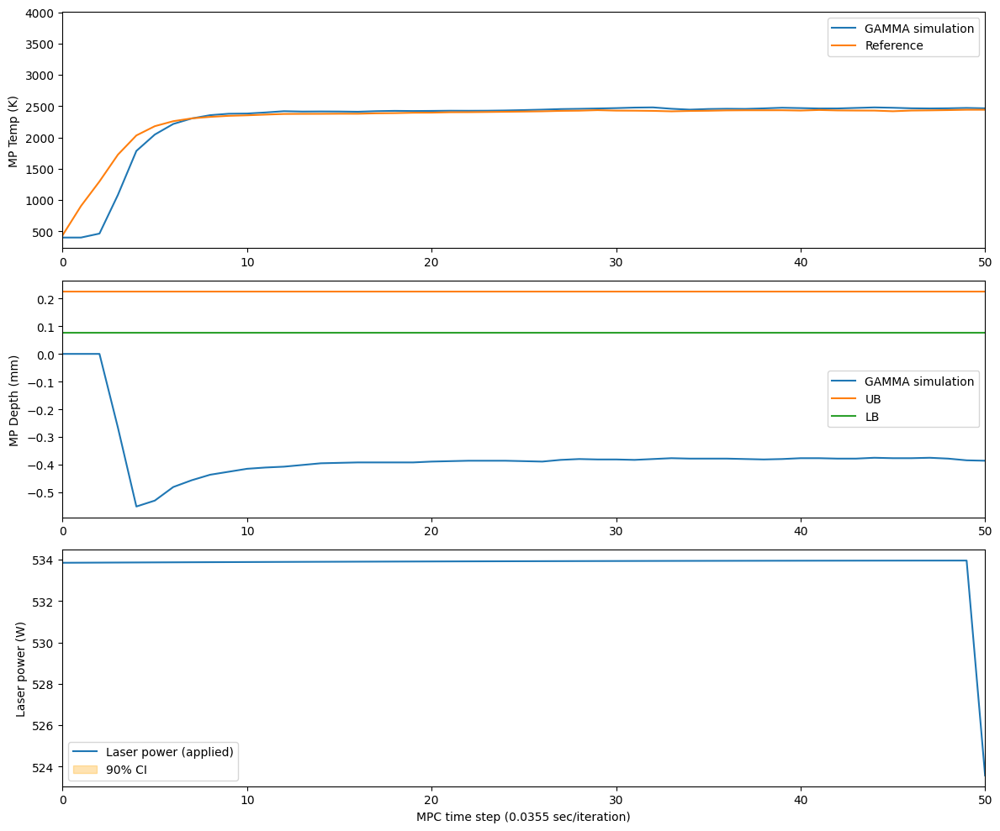

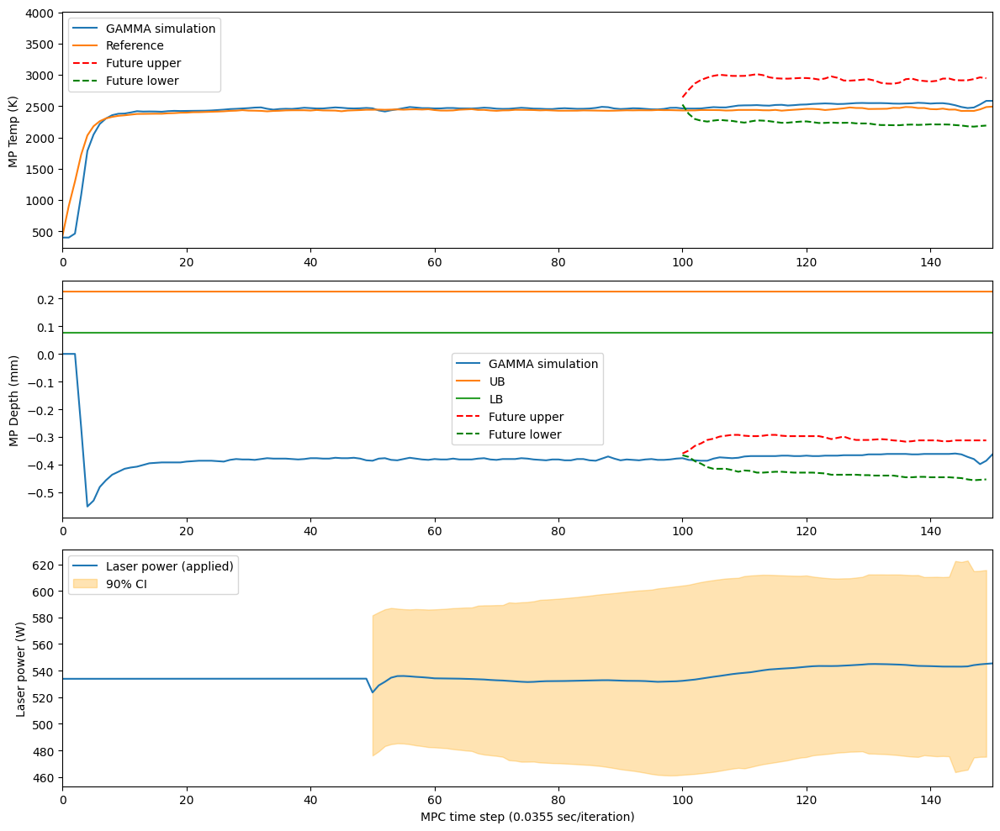

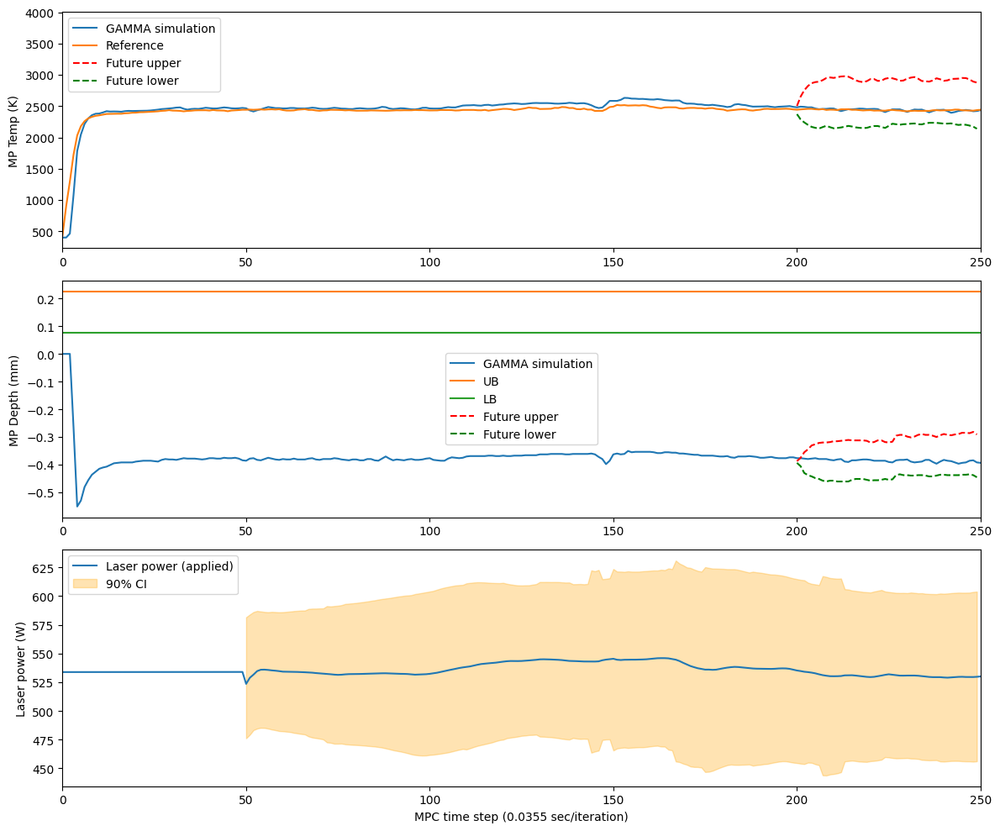

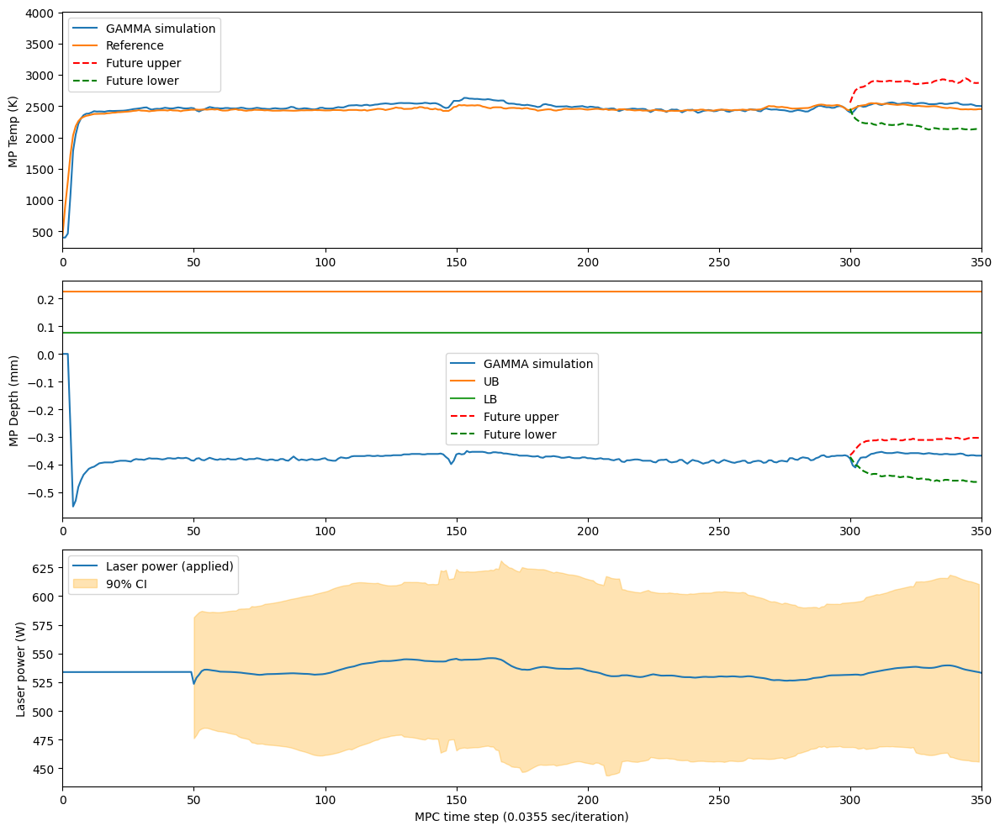

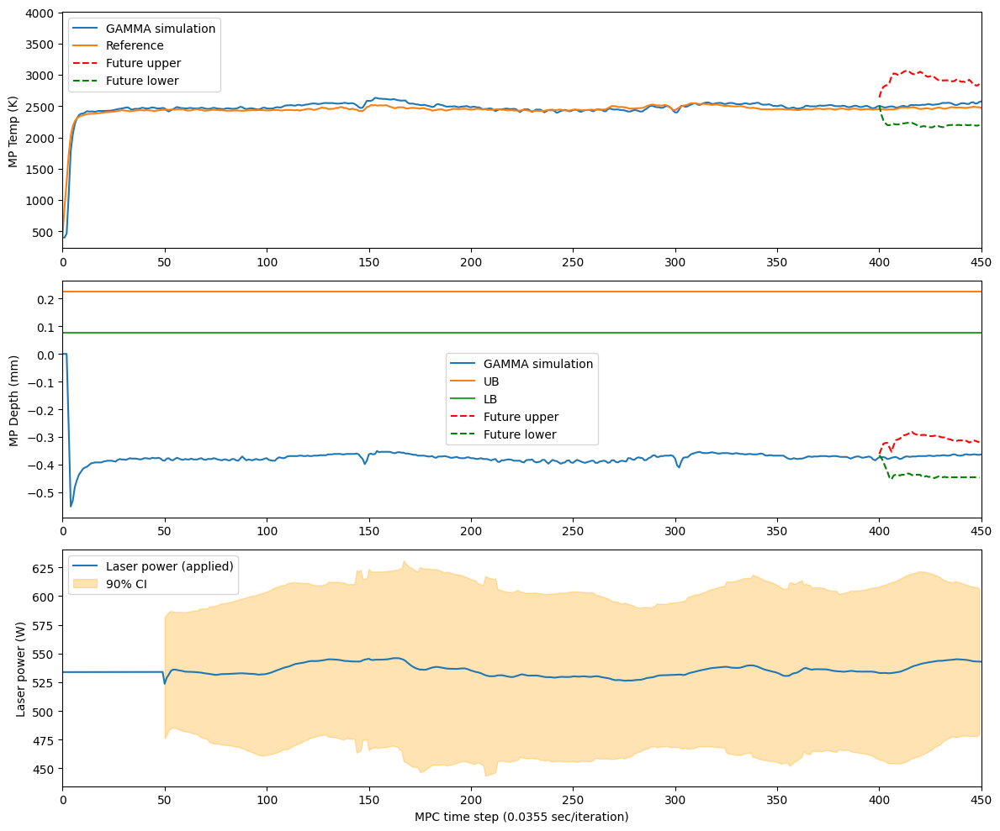

...

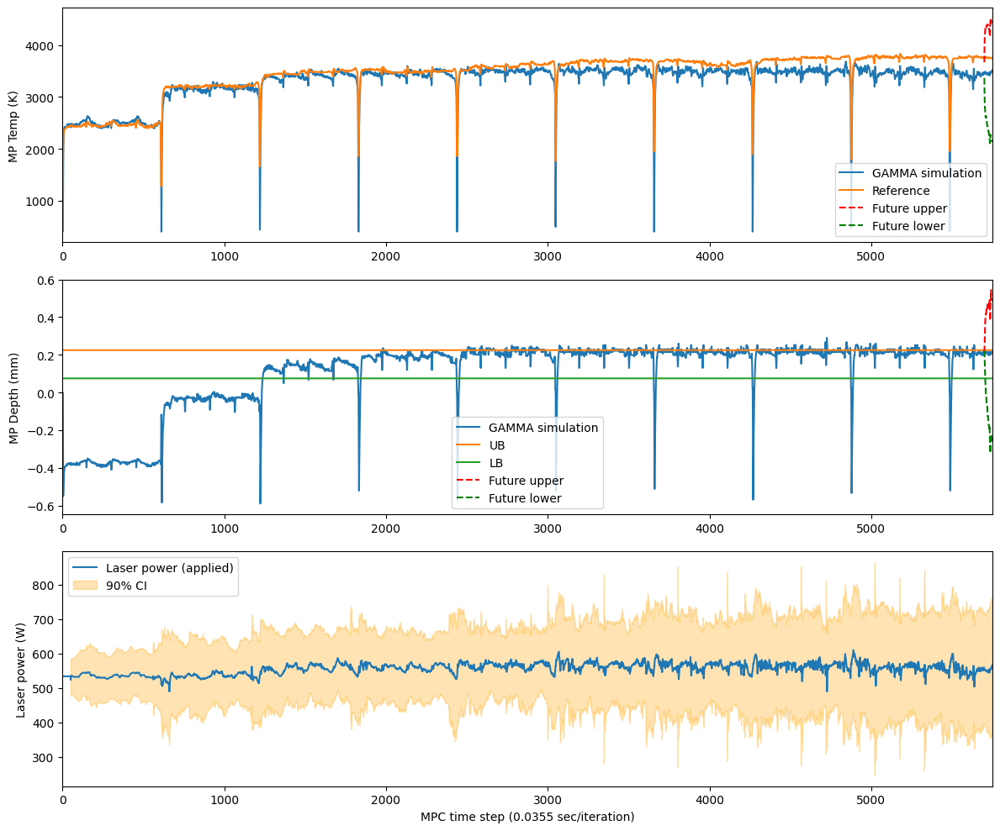

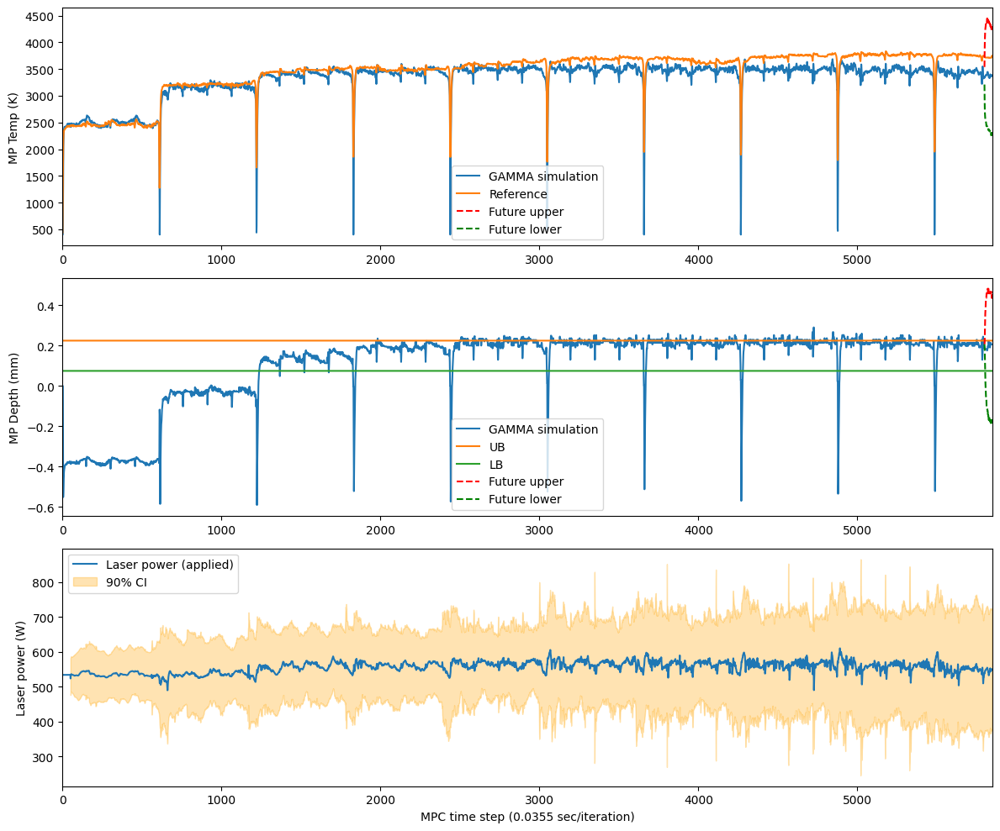

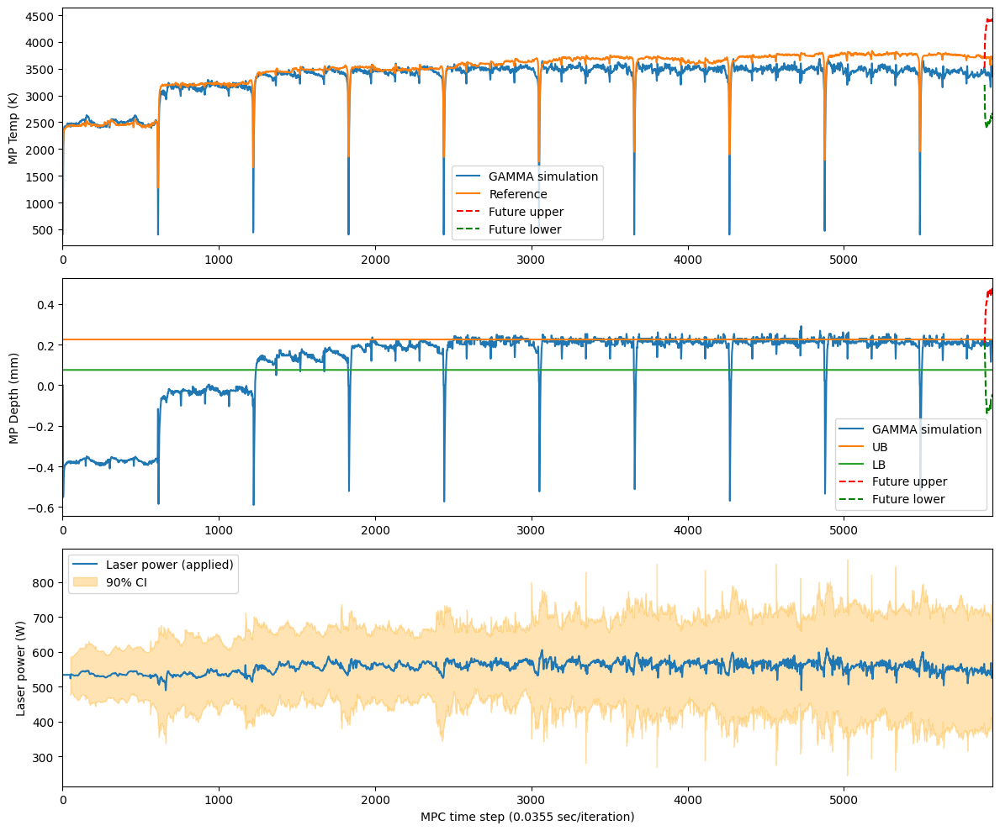

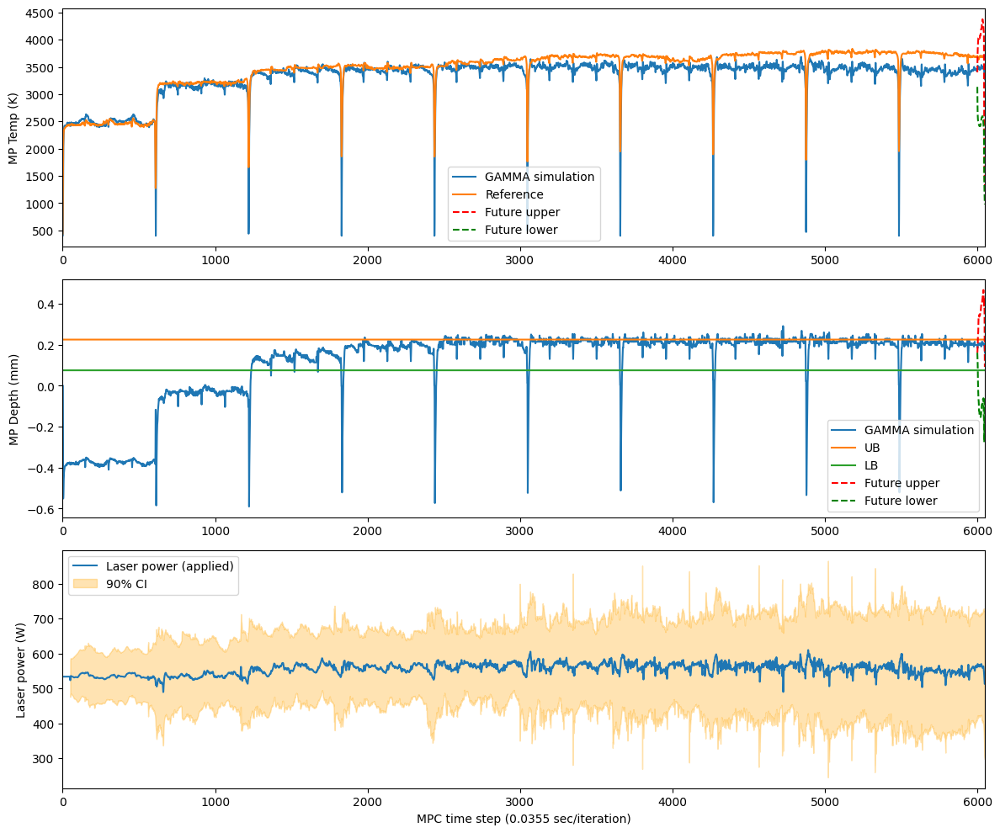

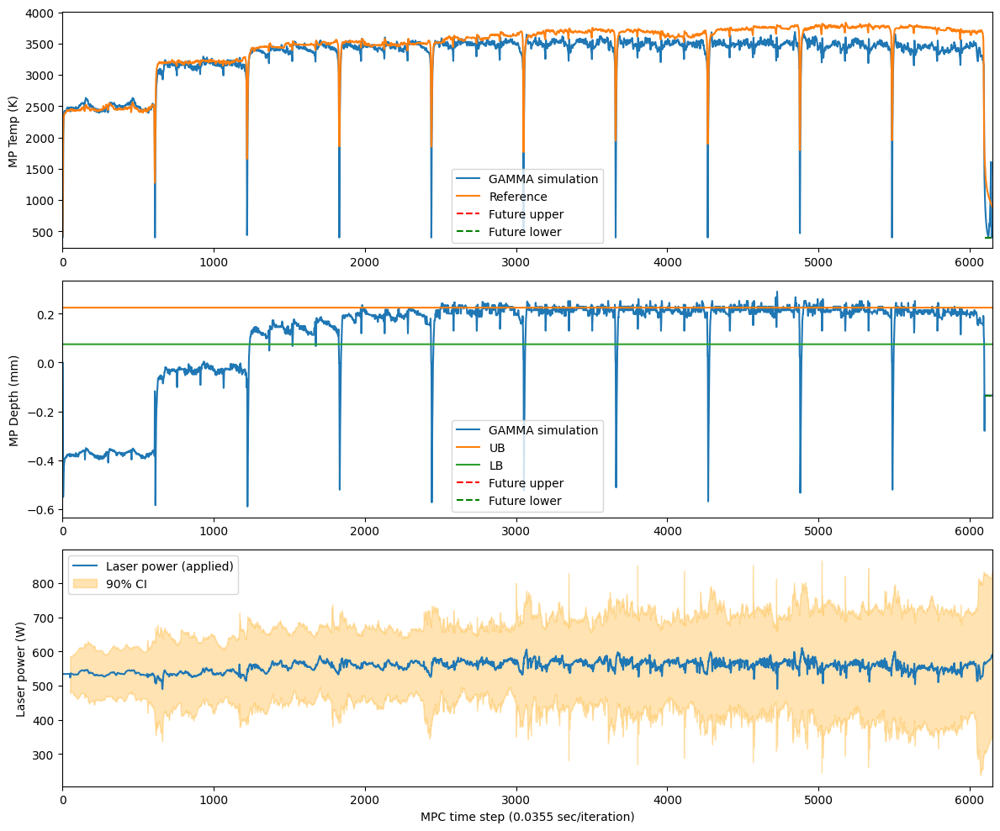

In [34]:
# step #
P = 50
N_step = len(mp_temp_ref) - init_runs + 50


# initialize GAMMA class
GAMMA_class.ref = mp_temp_ref
GAMMA_class.fix_cov_all = fix_covariates
GAMMA_class.x_past = init_avg.clone()
GAMMA_class.u_past = laser_power_past.clone()

GAMMA_class.x_hat_current = GAMMA_class.x_past[:, -1]
GAMMA_class.x_sys_current = GAMMA_class.x_past[:, -1].reshape(2, 1)

GAMMA_class.x_past_save = GAMMA_class.x_past.T.clone()
GAMMA_class.u_past_save = GAMMA_class.u_past.clone()
GAMMA_class.MPC_counter = window 


# execution loop
from tqdm import tqdm

for i in tqdm(range(N_step)):
    run_one_step_policy(GAMMA_class, model, P=P, window=window, laplace=kfac_laplace, uncertainty_log=uncertainty_log)

    if i % 100 == 0:
        plot_fig(GAMMA_class, N_step, i, uncertainty_log=uncertainty_log)


# Inspect KFAC Uncertainty


In [ ]:
uncertainty_df = pd.DataFrame(uncertainty_log)
uncertainty_df.head()
